# CCTV 영상을 활용한 어린이 사고 사전 조치 모듈 개발

In [ ]:
from ultralytics import YOLOvv8

model = YOLOvv8.from_pretrained("Ultralytics/YOLOv8")
source = 'http://images.cocodataset.org/val2017/000000039769.jpg'
model.predict(source=source, save=True)

In [ ]:
# 데이터의 용량이 큰 경우 압축을 코랩에서 푸는 것이 훨씬 효율적임
import zipfile

# zip 파일 경로
source_file = '/data/open.zip'

# 압축 해제 경로
extract_to_path = '/data/'

# 압축 해제
with zipfile.ZipFile(source_file, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)

In [ ]:
# 이미지 파일/라벨링 파일 상단으로 이동
import os
import shutil

# 최상위 폴더 경로 (본인 환경에 맞게 수정)
top_folder = '/content/Tsum_DataSet'

# 이미지 파일 확장자
image_extensions = ['.txt']  # 이미지 확장자 추가 가능

# 목적지 폴더 경로 (원하는 폴더 경로로 수정)
destination_folder = '/content/total/imges'

# 모든 이미지 파일의 경로를 수집
image_paths = []

for root, dirs, files in os.walk(top_folder):
    for file in files:
        if any(file.lower().endswith(ext) for ext in image_extensions):
            image_file_path = os.path.join(root, file)
            image_paths.append(image_file_path)

# 수집한 이미지 파일을 목적지 폴더로 이동 (shutil.move 사용)
for image_file_path in image_paths:
    # 이미지 파일의 이름만 가져오기
    _, image_name = os.path.split(image_file_path)

    # 이미지 파일을 목적지 폴더로 이동
    new_path = os.path.join(destination_folder, image_name)

    # 이미지 파일 이동
    shutil.move(image_file_path, new_path)
    print(f'moved: {image_file_path} -> {new_path}')


print("이미지 파일 이동이 완료되었습니다.")

In [ ]:
# split 코드
import os
import shutil
import random

# 원본 데이터 디렉토리와 분할된 데이터 디렉토리 경로 설정
data_dir = r'c:\Users\dsng3\OneDrive\Desktop\새 폴더'  # 원본 데이터 디렉토리 경로
train_dir = r'c:\Users\dsng3\OneDrive\Desktop\Data_Set_TSUM\train'  # 학습 데이터 저장 디렉토리 경로
test_dir = r'c:\Users\dsng3\OneDrive\Desktop\Data_Set_TSUM\test'    # 테스트 데이터 저장 디렉토리 경로
valid_dir = r'c:\Users\dsng3\OneDrive\Desktop\Data_Set_TSUM\valid'  # 검증 데이터 저장 디렉토리 경로

# 데이터 분할 비율 설정 (예: 70% 학습, 15% 검증, 15% 테스트)
train_ratio = 0.80
valid_ratio = 0.10
test_ratio = 0.10

# 원본 데이터 파일 목록 가져오기
file_list = os.listdir(os.path.join(data_dir, 'images'))  # images 폴더 내의 파일 목록을 가져옴

# 데이터를 무작위로 섞음
random.shuffle(file_list)

# 데이터 분할 인덱스 계산
total_samples = len(file_list)
num_train = int(total_samples * train_ratio)
num_valid = int(total_samples * valid_ratio)

# 데이터를 분할하여 이동
for i, file_name in enumerate(file_list):
    src_image_path = os.path.join(data_dir, 'images', file_name)
    src_label_path = os.path.join(data_dir, 'labels', file_name.replace('.jpg', '.json'))

    if i < num_train:
        dst_image_path = os.path.join(train_dir, 'images', file_name)
        dst_label_path = os.path.join(train_dir, 'labels', file_name.replace('.jpg', '.json'))
    elif i < num_train + num_valid:
        dst_image_path = os.path.join(valid_dir, 'images', file_name)
        dst_label_path = os.path.join(valid_dir, 'labels', file_name.replace('.jpg', '.json'))
    else:
        dst_image_path = os.path.join(test_dir, 'images', file_name)
        dst_label_path = os.path.join(test_dir, 'labels', file_name.replace('.jpg', '.json'))

    # 파일을 이동
    shutil.move(src_image_path, dst_image_path)
    shutil.move(src_label_path, dst_label_path)

print("데이터 분할이 완료되었습니다.")

# 아래 코드는 train에서 test를 split하는 코드임.
# import os
# import shutil
# import random

# # 원본 데이터 디렉토리와 분할된 데이터 디렉토리 경로 설정
# data_dir = '/Users/jangseongyu/Desktop/split_test'  # 원본 데이터 디렉토리 경로
# train_dir = '/Users/jangseongyu/Desktop/train_test_val_split_data_set/train'  # 학습 데이터 저장 디렉토리 경로
# test_dir = '/Users/jangseongyu/Desktop/train_test_val_split_data_set/test'    # 테스트 데이터 저장 디렉토리 경로
# valid_dir = '/Users/jangseongyu/Desktop/train_test_val_split_data_set/valid'  # 검증 데이터 저장 디렉토리 경로

# # 데이터 분할 비율 설정 (예: 90% 학습, 10% 테스트)
# train_ratio = 0.9
# test_ratio = 0.1

# # 원본 데이터 파일 목록 가져오기
# file_list = os.listdir(os.path.join(data_dir, 'images'))  # images 폴더 내의 파일 목록을 가져옴

# # 데이터를 무작위로 섞음
# random.shuffle(file_list)

# # 데이터 분할 인덱스 계산
# total_samples = len(file_list)
# num_train = int(total_samples * train_ratio)
# num_test = int(total_samples * test_ratio)

# # 데이터를 분할하여 이동
# for i, file_name in enumerate(file_list):
#     src_image_path = os.path.join(data_dir, 'images', file_name)
#     src_label_path = os.path.join(data_dir, 'labels', file_name.replace('.jpg', '.txt'))

#     if i < num_train:
#         dst_image_path = os.path.join(train_dir, 'images', file_name)
#         dst_label_path = os.path.join(train_dir, 'labels', file_name.replace('.jpg', '.txt'))
#     else:
#         dst_image_path = os.path.join(test_dir, 'images', file_name)
#         dst_label_path = os.path.join(test_dir, 'labels', file_name.replace('.jpg', '.txt'))

#     # 파일을 이동
#     shutil.move(src_image_path, dst_image_path)
#     shutil.move(src_label_path, dst_label_path)

# print("데이터 분할이 완료되었습니다.")


In [ ]:
# JSON2YOLO_txt -> 라벨링 데이터 전처리
import os
import json

def json_to_yolo_format(json_file: str, output_folder: str):
    with open(json_file, 'r') as f:
        data = json.load(f)

    # Get resolution of image
    image_width = data['description']['imageWidth']
    image_height = data['description']['imageHeight']

    # Parse file name to extract relevant information
    file_name = os.path.basename(json_file)
    # Remove extension from file name
    file_name = os.path.splitext(file_name)[0]

    # e.g., 'C000002_030_0050'
    write_file_base = file_name

    os.makedirs(output_folder, exist_ok=True)

    for annotation in data['annotations']['PM']:  # 모든 요소를 처리
        # 바운딩 박스 좌표 ( Unnormalized )
        x, y, w, h = annotation['points']

        # 바운딩 박스 중심 좌표 계산 ( Normalized )
        x_center = (x + w / 2) / image_width
        y_center = (y + h / 2) / image_height

        # 경계상자 width, height 계산 ( Normalized )
        width = w / image_width
        height = h / image_height

        # PM_code 값 가져오기
        pm_code = int(annotation['PM_code'])

        # Write boxes to txt files for each frame
        write_file = f"{write_file_base}.txt"
        with open(os.path.join(output_folder, write_file), 'a') as file:  # 'w'에서 'a'로 변경하여 모든 박스를 기록
            box_str = f"{pm_code} {x_center} {y_center} {width} {height}\n"
            file.write(box_str)

def main():
    OUTPUT_FOLDER = r"c:\Users\dsng3\OneDrive\Desktop\test"
    FOLDER_OF_JSONS = r"c:\Users\dsng3\OneDrive\Desktop\test"
    json_files = sorted(os.listdir(FOLDER_OF_JSONS))
    json_files = [f for f in json_files if f.lower().endswith('.json')]  # Filter JSON files

    os.makedirs(OUTPUT_FOLDER, exist_ok=True)
    for i, json_file in enumerate(json_files):
        json_to_yolo_format(
            json_file=os.path.join(FOLDER_OF_JSONS, json_file),
            output_folder=OUTPUT_FOLDER
        )

if __name__ == '__main__':
    main()


In [ ]:
# 라벨링 최종 ( 킥보드만... )
import os
import json

# PM 코드와 YOLO 라벨 인덱스의 매핑
PM_CODE_TO_LABEL = {
    28: 0,
    29: 1,
    30: 2,
    31: 3,
    32: 4,
    33: 5,
    35: 6,
    36: 7
}

def json_to_yolo_format(json_file: str, output_folder: str):
    with open(json_file, 'r') as f:
        data = json.load(f)

    # Get resolution of image
    image_width = data['description']['imageWidth']
    image_height = data['description']['imageHeight']

    # Parse file name to extract relevant information
    file_name = os.path.basename(json_file)
    # Remove extension from file name
    file_name = os.path.splitext(file_name)[0]

    # e.g., 'C000002_030_0050'
    write_file_base = file_name

    os.makedirs(output_folder, exist_ok=True)

    for annotation in data['annotations']['PM']:  # 모든 요소를 처리
        # PM_code 값 가져오기
        pm_code = int(annotation['PM_code'])

        # 유효한 PM 코드만 처리
        if pm_code in PM_CODE_TO_LABEL:
            label_index = PM_CODE_TO_LABEL[pm_code]

            # 바운딩 박스 좌표 ( Unnormalized )
            x, y, w, h = annotation['points']

            # 바운딩 박스 중심 좌표 계산 ( Normalized )
            x_center = (x + w / 2) / image_width
            y_center = (y + h / 2) / image_height

            # 경계상자 width, height 계산 ( Normalized )
            width = w / image_width
            height = h / image_height

            # Write boxes to txt files for each frame
            write_file = f"{write_file_base}.txt"
            with open(os.path.join(output_folder, write_file), 'a') as file:  # 'w'에서 'a'로 변경하여 모든 박스를 기록
                box_str = f"{label_index} {x_center} {y_center} {width} {height}\n"
                file.write(box_str)

def create_yaml_file(output_folder: str, train_folder: str, val_folder: str, yaml_file: str):
    yaml_content = f"""
train: {train_folder}
val: {val_folder}

nc: 8
names: ['킥보드 탑승자', '킥보드 캐리어', '킥보드 탑승자 - 보행자도로 통행 위반', '킥보드 탑승자 - 안전모 미착용 위반', '킥보드 탑승자 - 무단 횡단 위반', '킥보드 탑승자 - 신호 위반', '킥보드 탑승자 - 횡단보도 주행 위반', '킥보드 탑승자 - 동승자 탑승 위반']
"""
    with open(os.path.join(output_folder, yaml_file), 'w') as f:
        f.write(yaml_content)

def main():
    OUTPUT_FOLDER = r"c:\Users\dsng3\OneDrive\Desktop\test"
    FOLDER_OF_JSONS = r"c:\Users\dsng3\OneDrive\Desktop\test"
    YAML_FILE = "dataset.yaml"
    TRAIN_FOLDER = "path/to/train"
    VAL_FOLDER = "path/to/val"

    json_files = sorted(os.listdir(FOLDER_OF_JSONS))
    json_files = [f for f in json_files if f.lower().endswith('.json')]  # Filter JSON files

    os.makedirs(OUTPUT_FOLDER, exist_ok=True)
    for i, json_file in enumerate(json_files):
        json_to_yolo_format(
            json_file=os.path.join(FOLDER_OF_JSONS, json_file),
            output_folder=OUTPUT_FOLDER
        )

    # YAML 파일 생성
    create_yaml_file(output_folder=OUTPUT_FOLDER, train_folder=TRAIN_FOLDER, val_folder=VAL_FOLDER, yaml_file=YAML_FILE)

if __name__ == '__main__':
    main()


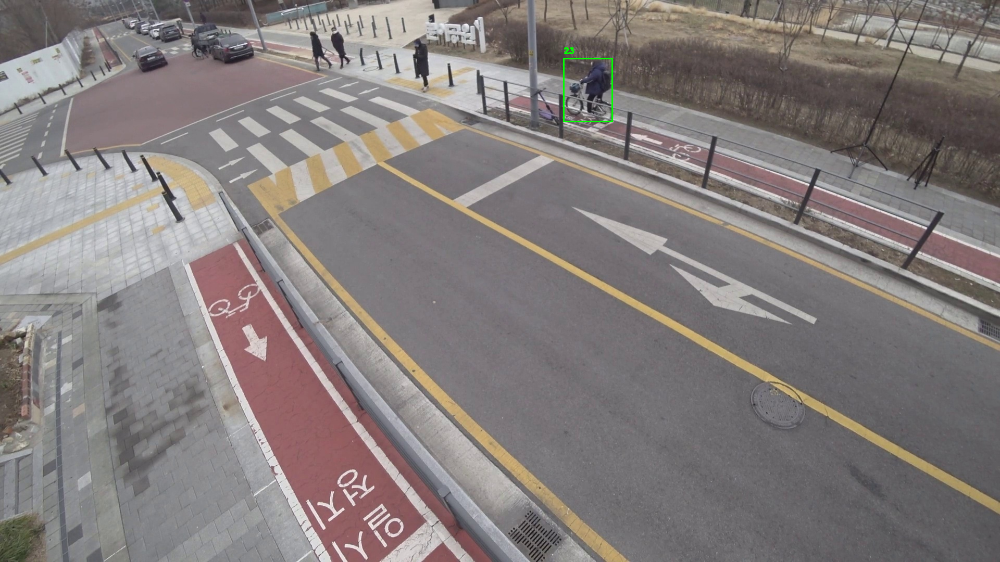

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

# YOLO 텍스트 파일을 읽어서 박스 정보 추출
with open(r'/content/T015512_002_0140_C_D_R_1.txt', 'r') as file:
    lines = file.readlines()

# 이미지 파일 경로
image_path = r'/content/T015512_002_0140_C_D_R_1.jpg'
# 이미지 로드
img = cv2.imread(image_path)
# 이미지의 너비와 높이 가져오기
height, width, _ = img.shape

for line in lines:
    values = line.strip().split()
    label, x_center, y_center, box_width, box_height = map(float, values)

    # 실제 픽셀 좌표로 변환
    x_center = int(x_center * width)
    y_center = int(y_center * height)
    box_width = int(box_width * width)
    box_height = int(box_height * height)

    # 바운딩 박스 좌상단과 우하단 좌표 계산
    x1 = int(x_center - box_width / 2)
    y1 = int(y_center - box_height / 2)
    x2 = int(x_center + box_width / 2)
    y2 = int(y_center + box_height / 2)

    # 박스 그리기
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # 이미지에 클래스 ID 추가
    class_name = values[0]
    cv2.putText(img, class_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# 이미지 출력
cv2_imshow(img)


In [ ]:
# 데이터 경로 설정 -> 완성된 데이터셋의 경로를 설정함.
# 데이터의 TREE는 Train - Valid - Test / images - labels로 구성되어야 함.

data_dir = '/content/Data_Set_TSUM_final' # 경로 설정
data_yaml = '/content/Data_Set_TSUM_final/data.yaml' # 경로 설정

In [ ]:
# yaml 파일 확인
import yaml

with open(data_yaml) as f:
  film = yaml.load(f, Loader=yaml.FullLoader)
  display(film)

  '''
train : /content/DataSet/images/train
val  : /content/DataSet/images/val
test : /content/DataSet/images/test

names :
  0: PM13
  1: PM14
  2: PM15
  3: PM16
  4: PM17
  5: PM18
  6: PM19
  7: PM20
  8: PM21
  9: PM22
  10: PM23
  11: PM24
  12: PM25
  13: PM26
  14: PM27
  15: PM28
  16: PM29
  17: PM30
  18: PM31
  19: PM32
  20: PM33
  21: PM35
  22: PM36
  '''

{'train': '/content/DataSet/images/train',
 'val': '/content/DataSet/images/val',
 'test': '/content/DataSet/images/test',
 'names': {0: 'PM13',
  1: 'PM14',
  2: 'PM15',
  3: 'PM16',
  4: 'PM17',
  5: 'PM18',
  6: 'PM19',
  7: 'PM20',
  8: 'PM21',
  9: 'PM22',
  10: 'PM23',
  11: 'PM24',
  12: 'PM25',
  13: 'PM26',
  14: 'PM27',
  15: 'PM28',
  16: 'PM29',
  17: 'PM30',
  18: 'PM31',
  19: 'PM32',
  20: 'PM33',
  21: 'PM35',
  22: 'PM36'}}

In [ ]:
# 드라이브 경로에 맞게 yaml 파일 수
film['train'] = '/content/Data_Set_TSUM_final/train'
film['val'] = '/content/Data_Set_TSUM_final/valid'
film['test'] = '/content/Data_Set_TSUM_final/test'

with open(data_yaml, 'w') as f:
  yaml.dump(film, f)


# yaml 파일 확인
import yaml

with open(data_yaml) as f:
  film = yaml.load(f, Loader=yaml.FullLoader)
  display(film)

{'names': {0: 'PM13',
  1: 'PM14',
  2: 'PM15',
  3: 'PM16',
  4: 'PM17',
  5: 'PM18',
  6: 'PM19',
  7: 'PM20',
  8: 'PM21',
  9: 'PM22',
  10: 'PM23',
  11: 'PM24',
  12: 'PM25',
  13: 'PM26',
  14: 'PM27',
  15: 'PM28',
  16: 'PM29',
  17: 'PM30',
  18: 'PM31',
  19: 'PM32',
  20: 'PM33',
  21: 'PM35',
  22: 'PM36'},
 'test': '/content/Data_Set_TSUM_final/test',
 'train': '/content/Data_Set_TSUM_final/train',
 'val': '/content/Data_Set_TSUM_final/valid'}

In [ ]:
# 파일 카운팅
import os

def count_files_in_folder(folder_path):
    total_files = 0

    # 폴더 내의 모든 파일 및 하위 폴더 탐색
    for root, dirs, files in os.walk(folder_path):
        total_files += len(files)

    return total_files

# 상위 폴더 경로 설정
parent_folder_path = '/content/Data_Set_TSUM_final/test'  # 실제 경로로 수정

# 상위 폴더 안에 있는 파일 개수 세기
total_files = count_files_in_folder(parent_folder_path)
print(f"상위 폴더 안에 총 {total_files}개의 파일이 있습니다.")

'''
test_images : 8464
test_labels : 8464

train_images : 39496
train_labels : 39496

val_images : 8463
val_labels : 8463
'''

상위 폴더 안에 총 16928개의 파일이 있습니다.


'\ntest_images : 8464\ntest_labels : 8464\n\ntrain_images : 39496\ntrain_labels : 39496\n\nval_images : 8463\nval_labels : 8463\n'

In [ ]:
# 라벨 불일치 해결
import os

def change_first_number_in_txt_files(folder_path):
    # 숫자 변환 매핑 생성
    number_mapping = {
        13: 0,
        14: 1,
        15: 2,
        16: 3,
        17: 4,
        18: 5,
        19: 6,
        20: 7,
        21: 8,
        22: 9,
        23: 10,
        24: 11,
        25: 12,
        26: 13,
        27: 14,
        28: 15,
        29: 16,
        30: 17,
        31: 18,
        32: 19,
        33: 20,
        35: 21,
        36: 22
    }

    # 폴더 내의 모든 txt 파일 탐색
    for root, dirs, files in os.walk(folder_path):
        for file_name in files:
            if file_name.endswith('.txt'):
                file_path = os.path.join(root, file_name)
                new_lines = []
                with open(file_path, 'r') as f:
                    for line in f:
                        parts = line.split()
                        if len(parts) > 0:
                            first_number = int(parts[0])
                            if first_number in number_mapping:
                                parts[0] = str(number_mapping[first_number])
                            new_line = ' '.join(parts)
                            new_lines.append(new_line)
                # 수정된 내용을 원래 파일에 덮어쓰기
                with open(file_path, 'w') as f:
                    for line in new_lines:
                        f.write(line + '\n')

# 상위 폴더 경로 설정
parent_folder_path = '/content/Data_Set_TSUM_final/test/labels'  # 실제 경로로 수정

# txt 파일의 첫 번째 숫자를 변경
change_first_number_in_txt_files(parent_folder_path)


# **YOLOv8n 버전 사용**

In [ ]:
# 라이브러리 다운 ( YOLOv8 )
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/779.6 kB ? eta -:--:--
     ━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━ 245.8/779.6 kB 7.2 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━ 757.8/779.6 kB 11.0 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.6/779.6 kB 9.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.w

In [ ]:
# 버전 체크
import ultralytics

ultralytics.checks()

ModuleNotFoundError: No module named 'ultralytics'

In [ ]:
# segment 버전 사용
from ultralytics import YOLO
from ultralytics import settings

model = YOLO(model='yolov8n.pt')


ModuleNotFoundError: No module named 'ultralytics'

In [ ]:
# 모델 학습
model.train(data='/content/Data_Set_TSUM_final/data.yaml', epochs=200, patience=30, batch=16,imgsz=320, project = '/content/drive/MyDrive/T-SUM 경진대회' )

Ultralytics YOLOv8.2.17 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Data_Set_TSUM_final/data.yaml, epochs=50, time=None, patience=30, batch=16, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/T-SUM 경진대회, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fal

100%|██████████| 755k/755k [00:00<00:00, 107MB/s]


Overriding model.yaml nc=80 with nc=23

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

train: Scanning /content/Data_Set_TSUM_final/train/labels... 39496 images, 0 backgrounds, 7 corrupt: 100%|██████████| 39496/39496 [00:46<00:00, 857.42it/s] 

train: WARNING ⚠️ /content/Data_Set_TSUM_final/train/images/C000895_000_0090_C_D_F_0.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Data_Set_TSUM_final/train/images/T007931_000_0070_B_D_F_0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0263      1.0167]
train: WARNING ⚠️ /content/Data_Set_TSUM_final/train/images/T008034_001_0144_B_D_F_0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.2102]
train: WARNING ⚠️ /content/Data_Set_TSUM_final/train/images/T008037_009_0020_C_D_F_0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.5494]
train: WARNING ⚠️ /content/Data_Set_TSUM_final/train/images/T008037_066_0126_C_D_F_0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0133      1.0782]
train: WARNING ⚠️ /content/Data_Set_TSUM_final/train/images/T008037_067_0096_C_D_F_0.jpg: ignoring corrupt image/label: non-normalized or out of bo

train: New cache created: /content/Data_Set_TSUM_final/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/Data_Set_TSUM_final/valid/labels... 8463 images, 0 backgrounds, 4 corrupt: 100%|██████████| 8463/8463 [00:06<00:00, 1296.54it/s]

val: WARNING ⚠️ /content/Data_Set_TSUM_final/valid/images/T008037_072_0012_C_D_F_0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3525]
val: WARNING ⚠️ /content/Data_Set_TSUM_final/valid/images/T008037_072_0156_C_D_F_0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [      1.354]
val: WARNING ⚠️ /content/Data_Set_TSUM_final/valid/images/T008037_100_0060_C_D_F_0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.2844       1.077]
val: WARNING ⚠️ /content/Data_Set_TSUM_final/valid/images/T015350_007_0378_C_D_F_1.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates []


val: New cache created: /content/Data_Set_TSUM_final/valid/labels.cache
Plotting labels to /content/drive/MyDrive/T-SUM 경진대회/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/T-SUM 경진대회/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.03G      1.704      3.148     0.9937          5        320: 100%|██████████| 2469/2469 [04:37<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:45<00:00,  5.83it/s]


                   all       8459      15176      0.364      0.292      0.228      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.03G      1.602      2.209     0.9674          2        320: 100%|██████████| 2469/2469 [04:23<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.97it/s]


                   all       8459      15176      0.445      0.346      0.311      0.183

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.02G      1.609      2.036     0.9726          4        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:45<00:00,  5.88it/s]


                   all       8459      15176      0.441      0.335      0.304      0.176

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.02G      1.575      1.869     0.9702          2        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.99it/s]


                   all       8459      15176      0.477      0.405       0.37      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.02G      1.499      1.709     0.9492          0        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.95it/s]


                   all       8459      15176      0.489      0.428      0.414      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.02G      1.458      1.625     0.9412          9        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  6.02it/s]


                   all       8459      15176      0.582      0.459      0.457      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.01G      1.424      1.556     0.9319          2        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.99it/s]


                   all       8459      15176      0.594      0.461      0.467        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.01G        1.4      1.516     0.9266          8        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.04it/s]


                   all       8459      15176      0.616      0.478      0.487      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.01G      1.373      1.482     0.9193          2        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:45<00:00,  5.83it/s]


                   all       8459      15176      0.624      0.474      0.496      0.325

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.01G      1.358      1.446     0.9159          2        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.06it/s]


                   all       8459      15176      0.576       0.51      0.512      0.337

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.01G      1.346      1.426     0.9126          5        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.07it/s]


                   all       8459      15176      0.613        0.5      0.524      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.01G      1.332      1.395     0.9094          1        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.07it/s]


                   all       8459      15176      0.611      0.516      0.528      0.353

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.01G      1.321      1.375     0.9069          4        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.03it/s]


                   all       8459      15176      0.626      0.511      0.537       0.36

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.01G      1.315      1.358     0.9058          5        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:45<00:00,  5.77it/s]


                   all       8459      15176      0.635      0.513      0.545      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.01G      1.304      1.344     0.9009          3        320: 100%|██████████| 2469/2469 [04:19<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.05it/s]


                   all       8459      15176      0.633      0.518      0.547       0.37

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.01G      1.296      1.332     0.9025          5        320: 100%|██████████| 2469/2469 [04:19<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.05it/s]


                   all       8459      15176      0.643      0.526      0.556      0.378

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         1G      1.282      1.314      0.898          1        320: 100%|██████████| 2469/2469 [04:19<00:00,  9.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.90it/s]


                   all       8459      15176       0.64      0.528      0.557      0.379

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.01G      1.274        1.3      0.897          8        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:46<00:00,  5.70it/s]


                   all       8459      15176       0.65      0.523       0.56      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         1G      1.273      1.292     0.8955          7        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.04it/s]


                   all       8459      15176      0.651      0.529      0.563      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         1G      1.261      1.273     0.8928          2        320: 100%|██████████| 2469/2469 [04:20<00:00,  9.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:46<00:00,  5.73it/s]


                   all       8459      15176      0.635      0.535      0.566      0.388

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         1G      1.255      1.265     0.8905          4        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:45<00:00,  5.83it/s]


                   all       8459      15176      0.641      0.548       0.57      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.01G       1.25      1.255     0.8903          1        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:46<00:00,  5.73it/s]


                   all       8459      15176      0.634      0.553      0.573      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.01G      1.246      1.246     0.8903          1        320: 100%|██████████| 2469/2469 [04:20<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.03it/s]


                   all       8459      15176      0.636      0.556      0.576      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         1G      1.238      1.238     0.8885          3        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:45<00:00,  5.78it/s]


                   all       8459      15176      0.641      0.556      0.577      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         1G      1.233      1.224     0.8874          2        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  6.01it/s]


                   all       8459      15176      0.646      0.553      0.578      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         1G      1.228      1.219     0.8854          3        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.99it/s]


                   all       8459      15176       0.65      0.551      0.579        0.4

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         1G      1.214      1.205     0.8835          5        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.92it/s]


                   all       8459      15176      0.649      0.553      0.581      0.402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         1G      1.222      1.207     0.8843          3        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.98it/s]


                   all       8459      15176      0.648      0.555      0.583      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         1G      1.213       1.19     0.8831          6        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:45<00:00,  5.85it/s]


                   all       8459      15176      0.649      0.554      0.584      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         1G      1.206      1.179     0.8802          7        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.95it/s]


                   all       8459      15176      0.651      0.553      0.585      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         1G      1.199      1.162     0.8799          7        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:45<00:00,  5.85it/s]


                   all       8459      15176      0.653      0.553      0.587      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         1G      1.193      1.161     0.8803          5        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.98it/s]


                   all       8459      15176      0.654      0.554      0.588      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         1G      1.188      1.149      0.879          7        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:45<00:00,  5.79it/s]


                   all       8459      15176      0.662      0.551      0.589      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         1G      1.185      1.138     0.8778         11        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  6.00it/s]


                   all       8459      15176      0.663      0.553      0.591       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         1G      1.179      1.142     0.8758          3        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.97it/s]


                   all       8459      15176       0.66      0.555      0.592      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         1G      1.171       1.12     0.8748          2        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.98it/s]


                   all       8459      15176      0.662      0.554      0.593      0.412

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         1G      1.167      1.115     0.8733          3        320: 100%|██████████| 2469/2469 [04:19<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.06it/s]


                   all       8459      15176      0.655      0.556      0.594      0.413

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         1G      1.165      1.104     0.8726          3        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:46<00:00,  5.75it/s]


                   all       8459      15176      0.634      0.566      0.596      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         1G      1.161      1.104     0.8724          5        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.95it/s]


                   all       8459      15176      0.635      0.569      0.597      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         1G      1.149      1.087     0.8686          6        320: 100%|██████████| 2469/2469 [04:18<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  6.02it/s]


                   all       8459      15176      0.635       0.57      0.598      0.417
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         1G      1.101      1.019     0.8614          2        320: 100%|██████████| 2469/2469 [04:19<00:00,  9.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.05it/s]


                   all       8459      15176      0.638       0.57        0.6      0.418

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         1G       1.09     0.9983     0.8592          1        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:45<00:00,  5.88it/s]


                   all       8459      15176      0.644      0.569      0.601      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50         1G      1.081     0.9898     0.8573          1        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.06it/s]


                   all       8459      15176       0.65      0.569      0.602       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         1G      1.075     0.9745     0.8573          1        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.98it/s]


                   all       8459      15176      0.652      0.569      0.604      0.422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         1G      1.066     0.9608     0.8548          1        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.98it/s]


                   all       8459      15176      0.659      0.567      0.605      0.423

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50         1G      1.061     0.9477     0.8529          1        320: 100%|██████████| 2469/2469 [04:15<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:46<00:00,  5.73it/s]


                   all       8459      15176      0.661      0.568      0.607      0.424

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         1G      1.055     0.9337     0.8526          2        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.04it/s]


                   all       8459      15176      0.658      0.572      0.608      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50         1G      1.044     0.9216     0.8504          2        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:44<00:00,  5.96it/s]


                   all       8459      15176      0.662       0.57       0.61      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         1G      1.039       0.91       0.85          2        320: 100%|██████████| 2469/2469 [04:17<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.03it/s]


                   all       8459      15176      0.664       0.57      0.611      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         1G      1.033     0.8997     0.8493          1        320: 100%|██████████| 2469/2469 [04:16<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:43<00:00,  6.03it/s]


                   all       8459      15176      0.664      0.571      0.612      0.429

50 epochs completed in 4.231 hours.
Optimizer stripped from /content/drive/MyDrive/T-SUM 경진대회/train2/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/T-SUM 경진대회/train2/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/T-SUM 경진대회/train2/weights/best.pt...
Ultralytics YOLOv8.2.17 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3010133 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 265/265 [00:46<00:00,  5.67it/s]


                   all       8459      15176      0.664      0.571      0.612      0.429
                  PM13       8459       1608      0.652      0.597      0.654      0.443
                  PM14       8459       1075      0.866       0.74      0.822      0.518
                  PM15       8459        145      0.704      0.483      0.558      0.376
                  PM16       8459         61      0.695      0.426      0.542      0.443
                  PM17       8459       1131      0.673      0.606      0.646      0.381
                  PM18       8459       1452      0.782      0.901      0.906      0.652
                  PM19       8459         76      0.573     0.0395      0.132      0.093
                  PM20       8459       1184      0.554      0.632      0.597      0.438
                  PM21       8459        412      0.585      0.113      0.227      0.153
                  PM22       8459       1053        0.5      0.435      0.408      0.257
                  PM2

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x787dc0514a00>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.0420

In [ ]:
# 데이터의 용량이 큰 경우 압축을 코랩에서 푸는 것이 훨씬 효율적임
import zipfile

# zip 파일 경로
source_file = '/content/runstest.zip'

# 압축 해제 경로
extract_to_path = '/content/'

# 압축 해제
with zipfile.ZipFile(source_file, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)

In [ ]:
# 학습 확인 / TensorBoard
%load_ext tensorboard
%tensorboard --logdir /content/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
import tarfile
import os
from ultralytics import YOLO

# .tar 파일을 추출할 경로 설정
tar_path = '/content/drive/MyDrive/T-SUM 경진대회/120model.tar'
extract_path = '/content/drive/MyDrive/T-SUM 경진대회/runs/weights/'

# .tar 파일 추출
with tarfile.open(tar_path, 'r') as tar:
    tar.extractall(path=extract_path)

# 추출된 디렉토리 내의 파일 목록 확인
extracted_files = os.listdir(extract_path)

# .pt 파일을 찾기
model_file = None
for file in extracted_files:
    if file.endswith('.pt'):
        model_file = os.path.join(extract_path, file)
        break

if model_file is None:
    raise FileNotFoundError("No .pt file found in the extracted .tar file.")

# 모델 로드
model = YOLO(model_file)

# 데이터셋 yaml 파일 경로 설정
dataset_yaml = '/content/Data_Set_TSUM_final/data.yaml'

# 성능 지표 평가
results = model.val(data=dataset_yaml, split='test')

# 성능 지표 출력
print(results)


Ultralytics YOLOv8.2.28 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3010133 parameters, 0 gradients, 8.1 GFLOPs


ParserError: while parsing a block mapping
  in "<unicode string>", line 1, column 1:
    train : '/content/DataSet/images ... 
    ^
expected <block end>, but found ','
  in "<unicode string>", line 1, column 40:
     ...  '/content/DataSet/images/train',
                                         ^

In [ ]:
# 모델 로드
model = YOLO(model_file)

# 데이터셋 yaml 파일 경로 설정
dataset_yaml = '/content/Data_Set_TSUM_final/data.yaml'

# 성능 지표 평가
results = model.val(data=dataset_yaml, split='test')

# 성능 지표 출력
print(results)

Ultralytics YOLOv8.2.28 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3010133 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/Data_Set_TSUM_final/test/labels... 8464 images, 0 backgrounds, 2 corrupt: 100%|██████████| 8464/8464 [00:07<00:00, 1175.69it/s]

val: WARNING ⚠️ /content/Data_Set_TSUM_final/test/images/T008037_066_0144_C_D_F_0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0145      1.0796]
val: WARNING ⚠️ /content/Data_Set_TSUM_final/test/images/T008037_068_0100_C_D_F_0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3495      1.5021]


val: New cache created: /content/Data_Set_TSUM_final/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 529/529 [01:08<00:00,  7.69it/s]


                   all       8462      15089      0.657      0.581      0.625      0.438
                  PM13       1059       1488      0.658      0.605      0.657      0.439
                  PM14       1159       1169      0.867      0.761      0.823      0.509
                  PM15        153        156      0.726        0.5      0.647      0.446
                  PM16         66         71      0.657      0.493      0.551      0.457
                  PM17        833       1148      0.657      0.622      0.668      0.391
                  PM18       1297       1509      0.799      0.905      0.916      0.668
                  PM19         51         73      0.414     0.0411      0.167      0.107
                  PM20        766       1239      0.519       0.63      0.572      0.416
                  PM21        288        370      0.581      0.114      0.208      0.143
                  PM22        709       1005       0.53      0.457      0.442      0.284
                  PM2

In [ ]:
import tarfile
import os
from ultralytics import YOLO

# .tar 파일을 추출할 경로 설정
tar_path = '/content/drive/MyDrive/T-SUM 경진대회/120model.tar'
extract_path = '/content/drive/MyDrive/T-SUM 경진대회/runs/weights/'

# .tar 파일 추출
with tarfile.open(tar_path, 'r') as tar:
    tar.extractall(path=extract_path)

# 추출된 디렉토리 내의 파일 목록 확인
extracted_files = os.listdir(extract_path)

# .pt 파일을 찾기
model_file = None
for file in extracted_files:
    if file.endswith('.pt'):
        model_file = os.path.join(extract_path, file)
        break

if model_file is None:
    raise FileNotFoundError("No .pt file found in the extracted .tar file.")

# 모델 로드
model = YOLO(model_file)

# 비디오 파일 예측 및 저장
video_path = '/content/KakaoTalk_Video_2024-05-23-19-38-40.mp4'
model.predict(source=video_path, save=True)




WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs



/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


video 1/1 (frame 1/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 77.0ms
video 1/1 (frame 2/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 7.3ms
video 1/1 (frame 3/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 6.3ms
video 1/1 (frame 4/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 6.5ms
video 1/1 (frame 5/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 8.6ms
video 1/1 (frame 6/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 8.8ms
video 1/1 (frame 7/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 8.7ms
video 1/1 (frame 8/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 7.1ms
video 1/1 (frame 9/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 6.6ms
video 1/1 (frame 10/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.m

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'PM13', 1: 'PM14', 2: 'PM15', 3: 'PM16', 4: 'PM17', 5: 'PM18', 6: 'PM19', 7: 'PM20', 8: 'PM21', 9: 'PM22', 10: 'PM23', 11: 'PM24', 12: 'PM25', 13: 'PM26', 14: 'PM27', 15: 'PM28', 16: 'PM29', 17: 'PM30', 18: 'PM31', 19: 'PM32', 20: 'PM33', 21: 'PM35', 22: 'PM36'}
 obb: None
 orig_img: array([[[129, 131, 147],
         [128, 130, 146],
         [123, 125, 141],
         ...,
         [239, 230, 227],
         [239, 230, 227],
         [239, 230, 227]],
 
        [[129, 131, 147],
         [128, 130, 146],
         [126, 128, 144],
         ...,
         [239, 230, 227],
         [239, 230, 227],
         [239, 230, 227]],
 
        [[133, 136, 149],
         [132, 135, 148],
         [131, 134, 147],
         ...,
         [239, 230, 227],
         [239, 230, 227],
         [239, 230, 227]],
 
        ...,
 
        [[166, 163, 162],
    

In [ ]:
# 결과물 산출
from ultralytics import YOLO
from ultralytics import settings


model = YOLO('/content/drive/MyDrive/T-SUM 경진대회/runs/weights/best.pt')

model.predict(source='/content/KakaoTalk_Video_2024-05-23-19-38-40.mp4',save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 9.2ms
video 1/1 (frame 2/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 7.0ms
video 1/1 (frame 3/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 6.9ms
video 1/1 (frame 4/960) /content/KakaoTalk_Video_2024-05-23-19-38-40.mp4: 320x192 1 PM28, 1 PM31, 7.1ms
video 1/1 (frame 5/960) /content/KakaoTalk_Video

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'PM13', 1: 'PM14', 2: 'PM15', 3: 'PM16', 4: 'PM17', 5: 'PM18', 6: 'PM19', 7: 'PM20', 8: 'PM21', 9: 'PM22', 10: 'PM23', 11: 'PM24', 12: 'PM25', 13: 'PM26', 14: 'PM27', 15: 'PM28', 16: 'PM29', 17: 'PM30', 18: 'PM31', 19: 'PM32', 20: 'PM33', 21: 'PM35', 22: 'PM36'}
 obb: None
 orig_img: array([[[129, 131, 147],
         [128, 130, 146],
         [123, 125, 141],
         ...,
         [239, 230, 227],
         [239, 230, 227],
         [239, 230, 227]],
 
        [[129, 131, 147],
         [128, 130, 146],
         [126, 128, 144],
         ...,
         [239, 230, 227],
         [239, 230, 227],
         [239, 230, 227]],
 
        [[133, 136, 149],
         [132, 135, 148],
         [131, 134, 147],
         ...,
         [239, 230, 227],
         [239, 230, 227],
         [239, 230, 227]],
 
        ...,
 
        [[166, 163, 162],
    